---
title: "12. Machine Listening"
subtitle: "Feature extraction, music information retrieval, and artificial intelligence"
---

This week is about *machine listening*: how sound becomes structured information that a computer can work with. It sits where music perception, signal processing, and machine learning meet. We follow the whole signal→symbol pipeline: capturing audio and cleaning it up, extracting features (spectral, timbral, harmonic, temporal), finding segments and events, and classifying and modelling how sound changes over time. Machine listening is the foundation for the more focused field of *music information retrieval* (MIR) and for today's musical AI.

The examples below use Python code with the librosa audio library, written as a Jupyter Notebook. You are not expected to learn these for this course, but it helps to know what they are:

<details>
<summary>Python programming language</summary>

[Python](https://www.python.org/) is a high-level programming language widely used for scientific computing, data analysis, and machine learning. It is based on loading various libraries that extend functionality, including general scientific computing libraries ([NumPy](https://numpy.org/), [SciPy](https://scipy.org/), [pandas](https://pandas.pydata.org/)), specific audio libraries ([librosa](https://librosa.org/), [Essentia](https://essentia.upf.edu/), [madmom](https://github.com/CPJKU/madmom)), and machine learning libraries ([PyTorch](https://pytorch.org/), [TensorFlow](https://www.tensorflow.org/)). Its clean syntax makes it relatively quick to learn and it can be deployed on many systems.
</details>

<details>
<summary>Jupyter Notebooks</summary>

A [Jupyter Notebook](https://jupyter.org/) is an interactive, web-based environment for creating and sharing documents that combine live code, rich text, visualisations, and results. Code is organised into executable cells with outputs shown inline, enabling iterative experimentation, data exploration, and reproducible workflows. Notebooks support multiple kernels (Python, R, Julia), rich media, and easy export to formats like HTML and PDF. This book is also written as a Jupyter Notebook!
</details>

<details>
<summary>Librosa audio library for Python</summary>

In the following, we will explore some of the functionality of [librosa](https://librosa.org/), a general-purpose, high-level Python library for audio / music analysis (easy prototyping, ML features).
</details>

:::{note} Working reproducibly
When you run notebooks or scripts yourself (or hand in project work), a few habits make results easier to repeat and to explain: keep a [conda](https://docs.conda.io/) or [venv](https://docs.python.org/3/library/venv.html) environment (or a `requirements.txt` / lockfile) with package versions; note your Python and operating-system versions; fix random seeds wherever randomness affects outputs (for example in machine-learning demos); and centralise preprocessing steps (resampling, normalisation, trimming) so the path from raw file to feature is traceable. When you use audio files or corpora, check the licence and attribution (for example Creative Commons terms on [Freesound](https://freesound.org/)) so sharing and redistribution stay legal and ethical.
:::


## Machine Listening

Machine listening, sometimes called [computer audition](https://en.wikipedia.org/wiki/Computer_audition), is the practice of turning sound—music, speech, or environmental audio—into structured, usable information. It builds on digital signal processing, but with a particular focus: capturing reliable audio, extracting features that reflect how we perceive sound, detecting events and boundaries, mapping patterns to labels, modelling how sound evolves over time, combining cues into higher-level interpretations, and presenting the results in a form people or other systems can use.

### Audio input and preprocessing

Whether audio arrives from microphones, interfaces, or files, reliable analysis begins with some basic [digital signal processing](https://en.wikipedia.org/wiki/Digital_signal_processing): resampling, DC removal, level normalisation, denoising, and de-clicking. These steps raise the signal-to-noise ratio, remove systematic artefacts such as low-frequency hum, and make features comparable across recordings, so the later stages behave predictably.

Once the audio is cleaned up, it can be the source for further analysis. A machine does not need to visualise sound to interpret it, but for the examples that follow, it helps to remember that the machine also starts with a waveform. As we have seen in earlier weeks, one of the basic ways to begin any audio analysis is to convert from the temporal domain (the waveform) to the spectral domain (for example, creating a spectrogram using FFT). 

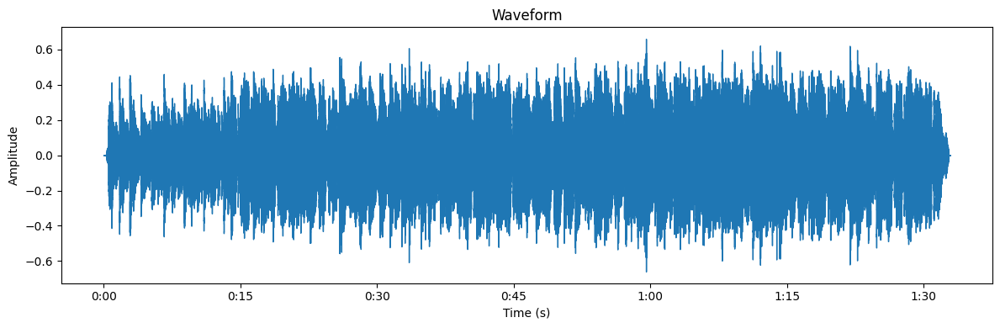

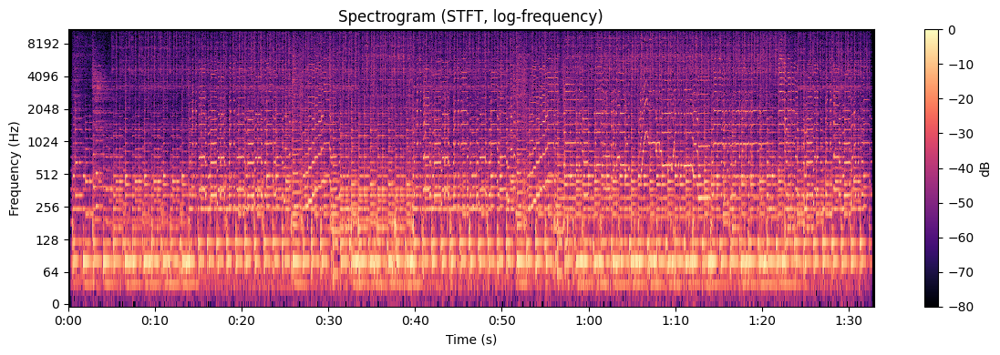

In [47]:
import librosa
from IPython.display import Audio, display
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

audio_path = "audio/week5_audio_ex_2_coltrane_myfavthings.mp3"
y, sr = librosa.load(audio_path, sr=22050, mono=True)

hop_length = 512

# Waveform (separate figure)
plt.figure(figsize=(12, 4))
try:
    librosa.display.waveshow(y, sr=sr)
except AttributeError:
    librosa.display.waveplot(y, sr=sr)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()

# show a playbar for the loaded audio below the spectrogram
display(Audio(audio_path))

# Spectrogram (STFT -> dB) (separate figure)
plt.figure(figsize=(12, 4))
S = np.abs(librosa.stft(y, n_fft=2048, hop_length=hop_length))
S_db = librosa.amplitude_to_db(S, ref=np.max)
librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='magma')
plt.title('Spectrogram (STFT, log-frequency)')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.colorbar(label='dB')
plt.tight_layout()
plt.show()


### Feature extraction

*Feature extraction* converts raw audio (waveforms or spectrograms) into compact descriptors that better reflect perceptual and musical structure. Features are commonly grouped by abstraction level:

- **Low-level descriptors** are useful for timbre and energy tracking. They are typically short-term and include features such as spectral centroid, bandwidth, rolloff, spectral flatness, RMS, and zero-crossing rate.
- **Mid-level descriptors** are useful for key, chord, and melodic analysis. They focus on harmonic/tonal relationships and include chromagram, constant-Q transforms (CQT), F0/pitch contours, and harmonic-percussive decomposition.
- **High-level descriptors** are useful for rhythm and structure analysis. They include temporal developments such as onset strength, tempogram, beat tracking, and segment boundaries.

Some of these work in the temporal domain (waveforms), others in the spectral domain (spectrograms), and some combine both. Extracting musical features from audio is not straightforward. As an example, let us look at a [chromagram](https://en.wikipedia.org/wiki/Chroma_feature), which estimates the pitch classes in a recording (the same twelvefold reduction used analytically in [harmony and melody](harmony-and-melody.ipynb)): 

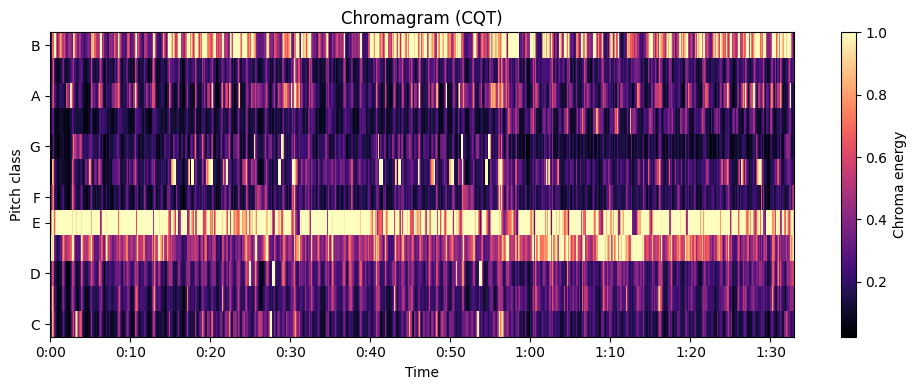

In [ ]:
# Compute chromagram (CQT-based)
chroma = librosa.feature.chroma_cqt(y=y, sr=sr, hop_length=hop_length)

plt.figure(figsize=(12, 4))
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', sr=sr, hop_length=hop_length, cmap='magma')
plt.colorbar(label='Chroma energy')
plt.title('Chromagram (CQT)')
plt.tight_layout()
# show the plot and an audio playbar for the loaded file
plt.show()


From the chromagram, we see that there is a lot of chroma energy for E. This is also what the machine finds when calculating the average:  

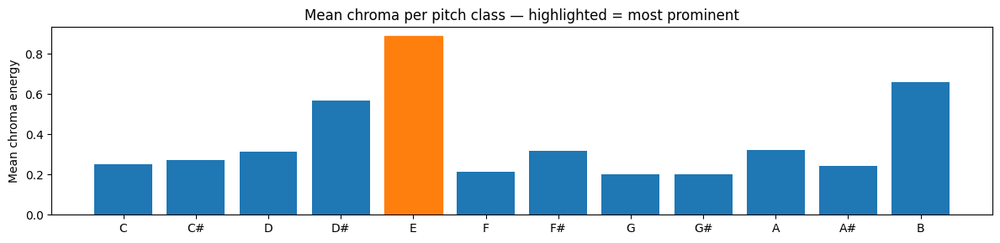

In [48]:
pitch_names = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
chroma_mean = chroma.mean(axis=1)
mean_chroma = chroma_mean

idx = int(np.argmax(mean_chroma))
prominent = pitch_names[idx]
prominence = float(mean_chroma[idx])

# simple bar plot highlighting the most prominent class
plt.figure(figsize=(12, 3))
bars = plt.bar(pitch_names, mean_chroma, color='C0')
bars[idx].set_color('C1')
plt.ylabel('Mean chroma energy')
plt.title('Mean chroma per pitch class - highlighted = most prominent')
plt.tight_layout()
plt.show()


Let us then turn to another feature, trying to estimate the tempo of the song. We can begin by making a *tempogram*, which estimates prominent tempo profiles over time: 

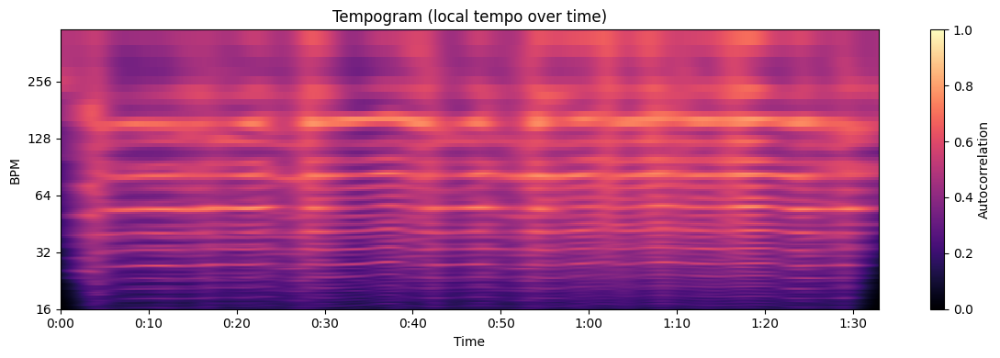

In [49]:

# Tempogram (rhythmic autocorrelation)
onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
tempogram = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr, hop_length=hop_length)

plt.figure(figsize=(12, 4))
librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='tempo', cmap='magma')
plt.colorbar(label='Autocorrelation')
plt.title('Tempogram (local tempo over time)')
plt.tight_layout()
plt.show()

From this plot, it is not so easy to see what the estimated tempo is. However, if we ask the computer to smooth the signal and average across bands, we get a clearer result: 

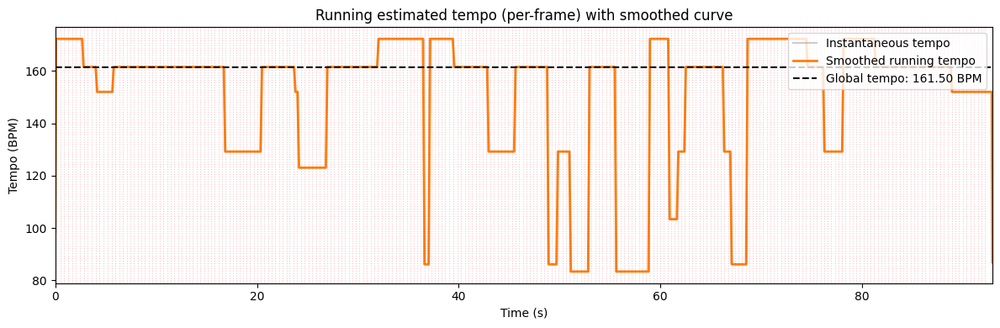

In [38]:
from librosa.feature import rhythm

times = librosa.frames_to_time(np.arange(len(onset_env)), sr=sr, hop_length=hop_length)
tempo_est = librosa.feature.tempo(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
tempo_running = rhythm.tempo(onset_envelope=onset_env, sr=sr, hop_length=hop_length, aggregate=None)

# Smooth the running estimate with a short moving average to reduce jitter
win = 7
kernel = np.ones(win) / win
tempo_smooth = np.convolve(tempo_running, kernel, mode='same')

plt.figure(figsize=(12, 4))
plt.plot(times, tempo_running, color='gray', alpha=0.4, label='Instantaneous tempo')
plt.plot(times, tempo_smooth, color='C1', linewidth=2, label='Smoothed running tempo')
plt.axhline(float(tempo_est[0]), color='k', linestyle='--', linewidth=1.5, label=f'Global tempo: {tempo_est[0]:.2f} BPM')

# Optionally mark beat times
if 'beat_times' in globals():
    for bt in beat_times:
        plt.axvline(bt, color='r', linestyle=':', alpha=0.25, linewidth=0.8)

plt.xlabel('Time (s)')
plt.ylabel('Tempo (BPM)')
plt.title('Running estimated tempo (per-frame) with smoothed curve')
plt.legend(loc='upper right')
plt.xlim(times[0], times[-1])
plt.tight_layout()
plt.show()


Notice how the instantaneous tempo fluctuates quite a lot. This is common with real-world signals and is one of the reasons we typically average ("smooth") the signal to find a result. Here the estimated tempo of 161 BPM is quite close to what a human would guess. 

### Source Separation

*Source separation* means isolating individual instruments or voices from a mixed audio signal. It is a hard problem and still not fully solved. A simple example is shown below, where we split the signal into "harmonic" and "percussive" components: 

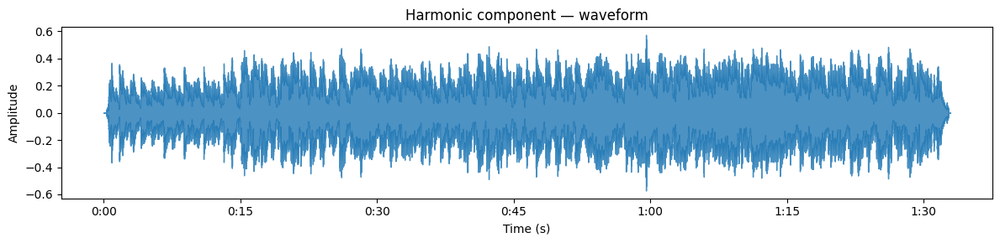

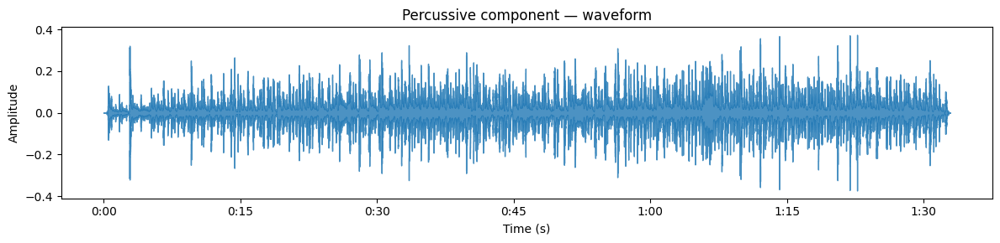

In [39]:
y_harmonic, y_percussive = librosa.effects.hpss(y)

# Harmonic waveform in its own figure
plt.figure(figsize=(12, 3))
ax_h = plt.gca()
librosa.display.waveshow(y_harmonic, sr=sr, alpha=0.8, ax=ax_h)
ax_h.set(title='Harmonic component - waveform', ylabel='Amplitude', xlabel='Time (s)')
plt.tight_layout()
plt.show()

# Percussive waveform in its own figure
plt.figure(figsize=(12, 3))
ax_p = plt.gca()
librosa.display.waveshow(y_percussive, sr=sr, alpha=0.8, ax=ax_p)
ax_p.set(title='Percussive component - waveform', ylabel='Amplitude', xlabel='Time (s)')
plt.tight_layout()
plt.show()


Traditional signal-processing methods are mature and well understood. Deep-learning approaches often do better in difficult cases, such as separating many overlapping sources, but rule-based methods remain useful when you need real-time results or are working with limited data and compute.

### Segmentation and event detection

Segmentation and event detection are about locating boundaries and discrete events such as onsets, beats, or section changes. A traditional method looks for repeating patterns with a [self-similarity matrix](https://en.wikipedia.org/wiki/Self-similarity): the signal is compared with itself, and recurring patterns become visible: 

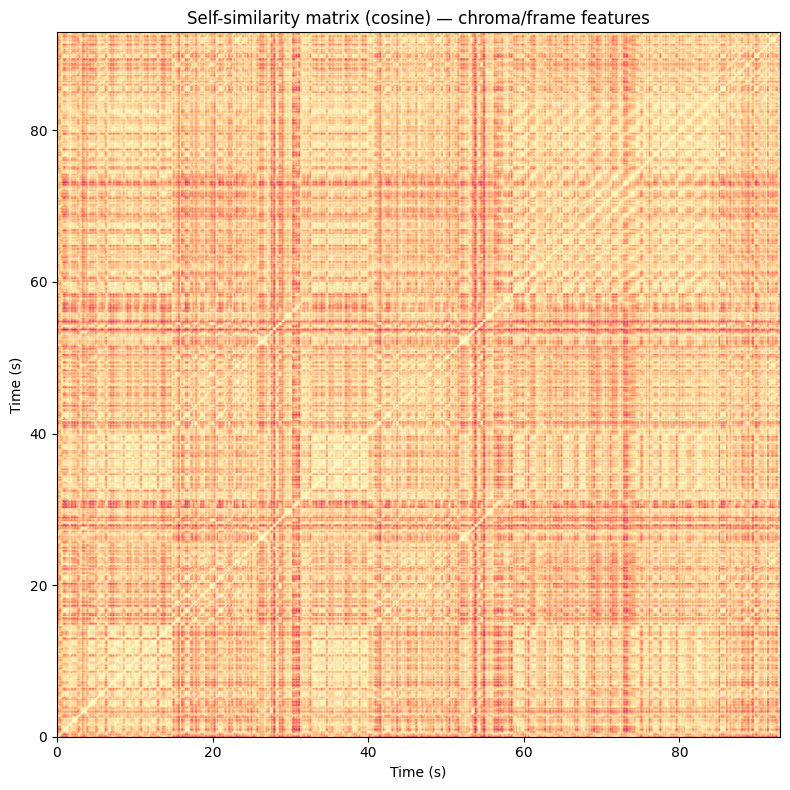

In [40]:
# Compute and plot a self-similarity matrix using chroma frame features
X_feat = chroma.T  # shape: (n_frames, n_pitches)

# L2-normalize frame vectors (avoid division by zero)
norms = np.linalg.norm(X_feat, axis=1, keepdims=True)
norms[norms == 0] = 1.0
Xn = X_feat / norms

# Cosine self-similarity (frames x frames)
ssm = np.dot(Xn, Xn.T)

# Plot the self-similarity matrix mapped to time (uses `times` array already in the notebook)
plt.figure(figsize=(8, 8))
extent = [times[0], times[-1], times[0], times[-1]]  # map indices to seconds
plt.imshow(ssm, origin='lower', aspect='auto', cmap='magma', extent=extent, vmin=0, vmax=1)
plt.xlabel('Time (s)')
plt.ylabel('Time (s)')
plt.title('Self-similarity matrix (cosine) - chroma/frame features')

# Optionally overlay beat times if available
if 'beat_times' in globals():
    for bt in beat_times:
        plt.axvline(bt, color='w', linestyle='--', linewidth=0.5, alpha=0.3)
        plt.axhline(bt, color='w', linestyle='--', linewidth=0.5, alpha=0.3)

plt.tight_layout()
plt.show()


The self-similarity matrix shows the pairwise similarity between frames: repeating sections appear as off-diagonal parallel stripes, and boundaries appear where similarity across the diagonal drops. We can then ask the computer to (A) detect boundary times (change points) and (B) group frames into part labels (verse/chorus/bridge, or repeated segments). Combining local novelty (for transitions) with global clustering (for part grouping) is the standard practical route from a self-similarity matrix to musical parts and transitions.

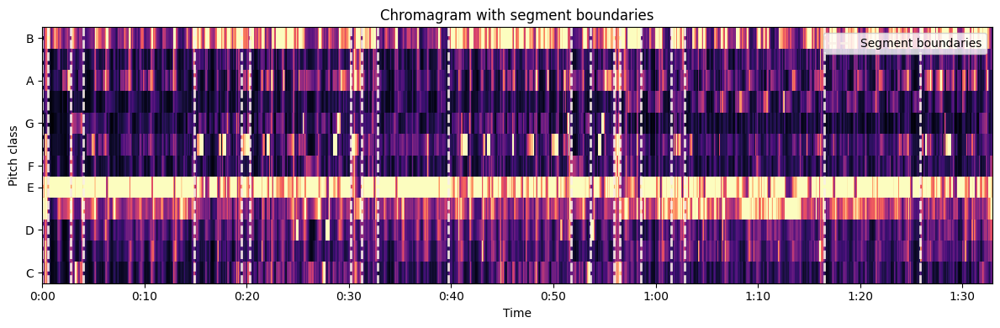

In [51]:
chroma = librosa.feature.chroma_cqt(y=y, sr=sr)
bounds = librosa.segment.agglomerative(chroma, 20)
bound_times = librosa.frames_to_time(bounds, sr=sr)

import matplotlib.pyplot as plt
import matplotlib.transforms as mpt
fig, ax = plt.subplots(figsize=(12, 4))
trans = mpt.blended_transform_factory(
            ax.transData, ax.transAxes)
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', ax=ax)
ax.vlines(bound_times, 0, 1, color='linen', linestyle='--',
          linewidth=2, alpha=0.9, label='Segment boundaries',
          transform=trans)
ax.legend()
ax.set(title='Chromagram with segment boundaries')
plt.tight_layout()
plt.show()

It is further possible to compare the segments to evaluate the musical form. However, this requires more code and interpretation, so we won't consider that further here. 

## Music Information Retrieval

The last example already moved us from general machine listening into [music information retrieval](https://en.wikipedia.org/wiki/Music_information_retrieval) (MIR), a more specialised form of machine listening aimed at pulling structured, useful information out of musical audio and related data. MIR draws on signal processing, machine learning, music theory, and human-centred evaluation to support tasks such as metadata extraction, music search, analysis, learning, and interactive applications. The sections below describe the core MIR tasks, the typical approaches, and some practical considerations for building and evaluating systems.

### MIR tasks

- **Classification and recognition** includes identifying instruments, genres, or whether a recording contains speech or music. When working with large music collections, this means tools that can tag files, find similar pieces, or detect instrumentation in recordings. Methods range from simple spectral/timbral feature matching to modern neural classifiers. Common pitfalls are dataset bias, noisy recordings, and confusion between timbrally similar instruments.

- **Recommendation systems** combine audio-derived features (timbre, tempo) with user behaviour to suggest music. Content-based recommenders use the audio descriptors themselves. Collaborative methods exploit listening patterns across users. Many modern systems are hybrid and combine information from audio and user data. These systems help discover repertoire or playlists but are prone to bias and may have privacy concerns.

- **Automatic transcription systems** convert audio into symbolic scores (MIDI, MusicXML). Monophonic pitch tracking is quite stable these days, but full polyphonic, multi-instrument transcription remains a challenge. Techniques include spectral analysis with onset/pitch heuristics, probabilistic sequence models, and end-to-end deep networks.

- **Segmentation and structure analysis** help find meaningful regions (intro, verse, chorus) or discrete events (onsets, section boundaries) in audio files. Approaches use self-similarity and novelty detection, supervised boundary detectors, or learned embeddings. These tools are useful for form analysis, remixing, and practice. However, "meaningful" boundaries are often subjective, so evaluation uses tolerance windows and human judgement.

- **Question-Answering systems** let you query audio with natural language (e.g., “Find tracks with a trumpet solo” or “show passages in major mode with fast tempo”). They combine audio tagging, metadata, lyrics, and semantic embeddings to match queries to segments. Key issues are building accurate multimodal indexes, mapping user language to reliable musical labels, and providing interpretable results.

- **Mood, emotion, and other higher-level feature extraction** are active research topics in the MIR community. These revolve around estimating human responses to various types of music, which is also where they cross paths with contemporary music psychology research. This is challenging, given the large individual differences between people and the impact of cultural background and contextual factors.

```{admonition} Question
:class: question
Can you think of any examples of how these techniques are implemented in systems you use?
```

### Music Data

Data is at the core of any information retrieval system. Traditionally, MIR tasks worked mainly with *symbolic data*, in the form of [MIDI](https://en.wikipedia.org/wiki/MIDI) or [MusicXML](https://en.wikipedia.org/wiki/MusicXML) files. Over the last decades, most research has shifted to audio files, which can be seen as a form of *subsymbolic data*: they do not deal with "symbols" but with the raw audio itself.

Additional information can be found in [metadata](https://en.wikipedia.org/wiki/Metadata), including contextual information such as artist or album details. [Paradata](https://en.wikipedia.org/wiki/Paradata) can tell us how the data was recorded or analysed, while [user data](https://en.wikipedia.org/wiki/Personal_data) can reveal personal information about how people access and use it, such as listening patterns and preferences.

For researchers, one major challenge is getting access to diverse music data while respecting legal and ethical constraints. Copyright, performer and composer rights, licensing terms, and privacy (for user or performer data) all restrict what can be downloaded, redistributed, or used for training and publication. These constraints affect dataset size, representativeness, and the ability to share reproducible code and trained models.

To work around some of this, researchers often turn to openly licensed resources (CC0/CC-BY, public-domain) and well-documented research datasets, and they record and publish the licence and provenance for each item used. Another option is to avoid the source material altogether and rely on metadata or derived representations (for example, spectrograms or embeddings) when raw audio cannot be redistributed. This reduces legal risk, improves reproducibility, and makes it easier for others to build on your work while respecting creators’ rights and listeners’ privacy.


### "Multimodal" MIR

Multimodal MIR combines audio with other kinds of data to build more robust understanding and retrieval systems. The extra modalities complement the audio signal: lyrics can disambiguate mood or semantics, scores/MIDI provide exact pitches and timing, and video or motion reveal performer gestures or instrument identity. They also improve robustness and coverage, since missing or noisy audio can sometimes be recovered from aligned metadata or symbolic cues, and they enable new tasks such as audio–lyrics alignment, score-informed transcription, music-video scene understanding, cross-modal search (e.g., “find the clip where the singer sings ‘…’”), and richer recommendation.

```{admonition} Question
:class: question
Why is "multimodal data" a challenging term when working between music psychology and technology?
```

Common data types that are used include:
- Audio (waveform, spectrograms, features)
- Symbolic (MIDI, MusicXML, scores)
- Text (lyrics, tags, reviews)
- Video / images (music videos, performance recordings)
- Metadata & interaction logs (artist, playlist co-occurrence, play counts)
- Sensor / motion capture (gesture, conductor data)

Practical multimodal MIR raises several recurring issues. Temporal alignment is critical: different modalities (audio, score/MIDI, lyric timestamps, video frames, motion capture) have different sample rates and may suffer timing jitter, and even small misalignments can break tasks like score-informed separation or lyric-to-audio alignment. Use robust alignment methods (dynamic time warping, score-to-audio alignment, timestamp correction) and always inspect results both visually and by ear.

Modalities are often missing or noisy in real systems, so design graceful fallbacks: support audio-only operation when other channels are absent, apply masking or imputation for missing signals, and train models to cope with incomplete inputs so performance degrades gracefully rather than catastrophically.

Combining modalities increases compute and model complexity. You can keep this in check by reusing pretrained embeddings, keeping fusion layers lightweight, and training modular subsystems (separate encoders with a small fusion head), which also simplifies ablation and debugging.

Evaluation must reflect both per-modality performance and the end task: combine modality-specific metrics (onset/offset F1 for transcription, SDR/SAR for separation, mAP for retrieval) with perceptual and user-centred tests (listening studies, classroom tasks) to measure real usefulness beyond numeric scores.

Legal and ethical constraints matter throughout: lyrics, videos, and commercial recordings carry copyright and privacy limits. Prefer openly licensed datasets when possible, publish provenance and licences for every item used, and consider sharing derived representations (spectrograms, embeddings) instead of raw audio to reduce legal risk and improve reproducibility.

You will recognise concrete examples here: score-informed source separation (which requires tight audio–MIDI alignment), lyrics-aware snippet search (which needs reliable text timestamps and robust handling of missing or incorrect lyric lines), music-video analysis / visual beat tracking (which depends on accurate A/V sync and can be compute-heavy), and recommendation systems that fuse audio with interaction logs (which raise privacy and fairness questions).

A practical workflow: start with one strong modality (usually audio) and add others only when they demonstrably improve the task; introduce modalities incrementally and run per-modality ablation studies; use pretrained encoders or embeddings to reduce training cost; log and document data provenance and licences for every source; and validate improvements with both objective metrics and simple listening tests or classroom evaluations.

## Artificial Intelligence (AI)

Artificial Intelligence (AI) is commonly used to describe machine systems that perform tasks that normally require human cognitive abilities, such as perception, learning, reasoning, planning, and natural-language understanding. In music, this includes systems that can compose, perform, and analyse music.


### Rule-based vs Learning-based systems

Although learning-based systems get most of the attention these days, it helps to distinguish two broad types of AI system: rule-based and learning-based. There are also hybrid approaches that mix the two.

Rule-based systems rely on deterministic signal-processing heuristics—peak picking, thresholding, spectral rules, and simple decision logic—to make decisions. They are compact, easy to interpret and tune, and well suited to low-latency, resource-constrained tasks such as onset detection, simple VAD, or rule-based beat tracking. Their disadvantages are brittleness to noise and domain shifts, extensive hand-tuning, and limited ability to capture complex, data-driven patterns.

Learning-based approaches span classical supervised models (SVMs, random forests) on hand-crafted features through to modern end-to-end deep architectures (CNNs for timbre/scene classification, RNNs/TCNs for temporal structure, transformers for long-range context). Self- and semi-supervised pretraining (contrastive or predictive objectives) is common when labelled data are scarce, followed by task-specific fine-tuning. These methods typically offer higher accuracy and adaptivity, but require more labelled data or compute, can be harder to interpret, and demand careful validation against domain mismatch and dataset bias.

Hybrid approaches combine analytical signal-processing priors with learned components to get something of both worlds—for example, using handcrafted onset detectors to propose events that a learned model then refines, applying learned post-filters to classic spectrogram estimates, or enforcing musically motivated constraints (tempo, harmonicity) on machine-learning outputs. Hybrids often improve robustness and sample efficiency while keeping some interpretability. A practical workflow is to start with a simple rule-based baseline, then introduce learned or hybrid components where the data and performance needs justify the added complexity.

### Models

Some of the more well-known models you can come across in music research literature include:

- [Hidden Markov Models (HMMs)](https://en.wikipedia.org/wiki/Hidden_Markov_model) are probabilistic, generative sequence models that represent latent states and state transitions; they are useful for producing interpretable event or state sequences (for example, note or phoneme sequences) and work well in low-data regimes. Their strengths are being lightweight, well-understood, and providing explicit temporal-state structure, while their limitations include limited capacity for long-range dependencies and difficulty modelling complex, high-dimensional observations.

- [Recurrent Neural Networks (RNNs)](https://en.wikipedia.org/wiki/Recurrent_neural_network) and [Long Short-Term Memory (LSTM)](https://en.wikipedia.org/wiki/Long_short-term_memory) networks process sequences step-by-step, with LSTMs using gating mechanisms to mitigate vanishing/exploding gradients and capture longer dependencies; they are widely used for frame-level labelling, sequence-to-sequence tasks, and modelling expressive timing. Their advantages include good modelling of moderate temporal context and dynamics, whereas sequential computation can limit throughput and increase latency compared with more parallelisable architectures.

- Temporal or dilated convolutional networks (temporal CNNs, [TCNs](https://en.wikipedia.org/wiki/Temporal_convolutional_network)) use causal, time-respecting convolutions often combined with [dilated convolutions](https://en.wikipedia.org/wiki/Dilated_convolution) to model long histories in parallel; they offer large receptive fields with efficient, parallelisable computation and can be designed for low-latency streaming. Pros include parallel inference and controllable receptive field size; cons include sensitivity to architectural choices (dilation rates, kernel sizes) which determine the required context and memory usage. See also [convolutional neural network](https://en.wikipedia.org/wiki/Convolutional_neural_network).

- [Transformers](https://en.wikipedia.org/wiki/Transformer_(machine_learning_model)) and [attention-based models](https://en.wikipedia.org/wiki/Attention_(machine_learning)) use self-attention to model arbitrary pairwise interactions across a sequence, excelling at very long-range dependencies and sequence-to-sequence tasks such as transcription or structural analysis when paired with spectrogram or learned front-ends. They often achieve state-of-the-art results and provide flexible context modelling, but incur high compute and memory costs (quadratic attention can be expensive for long audio), though sparse/efficient attention variants can mitigate this.


### Realtime vs non-realtime

Machine listening systems can operate in different time modes, and the choice strongly affects algorithm design, latency, and evaluation.

- **Realtime (online)** — Processes audio as it arrives and must keep latency small and predictable (latency ≈ window_duration + model_lookahead + processing_time; e.g., n_fft=2048 at sr=22050 → window ≈ 92.9 ms, hop=512 → 23.2 ms steps). This requires causal algorithms (causal filters, causal convolutions, stateful RNNs/TCNs, or streaming transformers with limited lookahead), a streaming frontend with short windows/small hops, and cheap incremental features (onset strength, low-band log-mel, incremental CQT) plus simple online post-processing (peak picking, adaptive thresholds). Design priorities are low and stable latency, robustness to noise and jitter, and predictable, bounded compute so deployment constraints (CPU/GPU, battery, I/O) are met—in practice this often means lightweight models or hybrid pipelines (rule-based front end + small learned model).

- **Non-Realtime (offline / batch)** — processes full recordings after capture. Key trade-offs: no strict latency, so you can use larger windows, global context, and bidirectional models (bi-RNNs, full attention) for higher accuracy; you can run expensive post-processing (Viterbi smoothing, global segmentation, search) and use entire-track normalisation/augmentation; better for high-quality transcription, structure analysis, dataset annotation, or training-data generation.

- **Hybrid/buffered operation** — a common compromise is to run a low-latency online pass for immediate feedback and a higher-quality offline pass to refine the results; use short lookahead buffers (a few frames) to improve accuracy while keeping latency controlled, and document/expose the buffer size as the system's lookahead.

Design decisions should follow the application: live interaction needs minimal, predictable latency and causal algorithms, whereas analysis and annotation can exploit full-context offline methods for higher fidelity.

## Examples

There are many practical examples of machine listening and MIR in both research and industry. Below are curated open‑source projects followed by some commercial examples.

<details>
<summary>Open‑source examples</summary>

- **[librosa](https://librosa.org)** — A lightweight, high‑level Python library for audio analysis and feature extraction (spectrograms, chroma, MFCCs, tempograms). Good for prototyping and education. (pip install librosa)  

- **[Essentia](https://essentia.upf.edu)** — C++ DSP library with Python bindings: very large feature set, audio descriptors, and production‑grade implementations of many MIR algorithms (beat, onset, pitch, timbre). Useful when performance and completeness matter.  

- **[madmom](https://github.com/CPJKU/madmom)** — Focused on MIR tasks such as beat tracking, onset detection, and tempo estimation with efficient Cython code and pretrained models. Good for beat/onset pipelines and realtime-friendly algorithms.  

- **[Spleeter (Deezer)](https://github.com/deezer/spleeter)** — Fast, easy-to-use source separation (2/4/5 stems) with pretrained U‑Net models. Great for quick vocal/instrument separation and dataset preparation.  

- **[Open‑Unmix (UMX)](https://github.com/sigsep/open-unmix)** — Open, research‑oriented music source separation model (frequency‑domain, PyTorch) and evaluation scripts (museval). Good for reproducible separation experiments.  

- **[Demucs](https://github.com/facebookresearch/demucs)** — Time‑domain neural separator (waveform) that often yields strong perceptual quality for music separation. Useful as a modern baseline for source separation work.  

- **[CREPE](https://github.com/marl/crepe)** — A convolutional model for pitch/F0 estimation directly from waveform. Provides frame‑level pitch estimates and confidence measures.  

- **[Onsets & Frames (Magenta)](https://github.com/magenta/onsets-frames)** — Neural system for piano transcription (onset detection + framewise prediction + decoding). Good example of end‑to‑end transcription pipelines.  

- **[mir_eval](https://github.com/craffel/mir_eval)** / **[museval](https://github.com/sigsep/museval)** — Lightweight toolkits for standard MIR evaluation metrics (onset F1, SDR, etc.). Use these for consistent, comparable results.  

- **[JAMS](https://github.com/marl/jams)** — JSON‑based format and Python tools for storing and exchanging musical annotations (beats, chords, segments). Useful for reproducible annotation workflows.  
</details>

<details>
<summary>Datasets & benchmarks (open)</summary>

- **[MUSDB18](https://sigsep.github.io/datasets/musdb.html)** — Standard dataset for music source separation (stereo mixtures + stems).

- **[MAESTRO](https://magenta.tensorflow.org/datasets/maestro)** — Aligned piano audio + MIDI dataset used for transcription and generation.

- **[GTZAN](http://marsyas.info/downloads/datasets.html)** / **[Million Song Dataset](http://millionsongdataset.com)** — Popular collections for genre / large‑scale analysis (beware of known issues and biases).
</details>

<details>
<summary>Commercial examples</summary>

- [**Shazam**](https://www.shazam.com) — A consumer-facing music recognition service that identifies songs from short audio clips and returns metadata (title, artist, album) and listening links. Widely integrated into iOS/Android and many commercial platforms.

- [**ACRCloud**](https://www.acrcloud.com) — Commercial audio fingerprinting and automatic content recognition (ACR) for music identification, broadcast monitoring, copyright compliance, and synchronized second‑screen experiences. Offers cloud APIs and on‑device SDKs for streaming, broadcasting, and automotive use cases.

- [**Gracenote**](https://www.gracenote.com) — Metadata and music‑recognition services powering search, recommendation, and interactive media features for streaming platforms, consumer electronics, and infotainment systems. Commonly used to enrich catalogs and enable content discovery. 

- [**Audible Magic**](https://www.audiblemagic.com) — Content identification and rights management platform specialising in copyright compliance, fingerprinting, and monetization for user‑generated and professional video/audio content. Used by platforms that need automated rights enforcement and revenue attribution. 

- [**Cognitive Networks**](https://cognitivenetworks.ai) — Providers in this space deliver real‑time audio recognition and TV metadata using ML/ACR pipelines for interactive TV, personalized advertising, and programmatic experiences.
</details>

```{admonition} Other examples
:class: question
Can you think of any other examples of machine listening or music information retrieval?
```


## Machine vs human listening

Human (music) psychology and machine listening/technology form a mutually reinforcing loop: psychological knowledge constrains and guides algorithm design, while technology supplies tools, data, and interventions that extend what we can measure, model, and apply. Key points and practical implications:

### How music psychology informs technology
Perceptual representations derived from psychoacoustics—such as mel and ERB scales, loudness models, and masking curves—inform feature design and loss functions so that systems weight signal components in ways that match human sensitivity; this yields better compression, perceptual losses, and salience-aware processing.

Human temporal integration, memory limits, and expectancy shape choices for window and hop sizes, context length, and model architecture. Knowing how listeners integrate information over time helps decide whether to use short receptive fields, longer temporal context, or attention mechanisms to capture the appropriate temporal framing for a task.

Clear task definitions and annotation schemes benefit from psychological constructs: labelling targets in terms that reflect perceived categories (e.g., emotion, groove, perceived key) produces datasets and objectives that align with human judgements rather than with low-level signal properties, improving model relevance and interpretability.

Evaluation practice is guided by listening-based methods: objective metrics should be calibrated against perceptual judgements using listening tests (MUSHRA, pairwise comparisons) so that measured improvements correspond to meaningful changes for users; psychological methods help design rigorous, reliable perceptual evaluations.

Interaction and UX design draw on models of attention, affordance, and mental workload to produce interfaces and feedback that match user expectations. Insights from music psychology guide how to present analysis, how much detail to expose, and how to scaffold tasks such as practice tools or tutoring so they are cognitively effective and engaging.


### How technology supports music psychology

Technology enables scalable data collection and analysis by providing audio repositories, crowdsourcing platforms, and annotation tools that make it feasible to gather large behavioural datasets and diverse stimuli. These resources support robust, ecologically valid studies by broadening the range of musical examples and participant populations that can be analysed.

Precise stimulus control and replication are made possible through synthesisers, signal‑processing toolkits, and digital audio workstations (DAWs). These tools let researchers generate tightly controlled stimuli to isolate perceptual variables, run repeatable manipulations, and share identical materials across labs for reproducible experiments.

Instrumentation for measurement—such as EEG, MEG, fMRI, motion capture, eye‑tracking, and physiological sensors—provides objective access to neural, motor, and autonomic responses to music. Combined with careful experimental design, these modalities allow researchers to link behavioural effects to underlying physiological processes and to explore timing, localisation, and dynamics of musical perception and action.

Computational models and simulation expand the theoretical toolkit: machine learning and formal modelling enable quantitative hypotheses (predictive coding, attention models), permit in silico testing of ideas, and can simulate listener groups or clinical conditions (for example, hearing loss). These approaches help formalise perceptual theories and generate testable predictions for empirical work.

Finally, technology supports translation of psychological insights into real‑world interventions and applications. Examples include adaptive tutoring systems, hearing‑assistive signal processing, music‑therapy apps, and context‑aware recommendation engines that operationalise lab findings into tools with practical impact.

### Some considerations

Feature design should be grounded in auditory perception: representations such as mel‑spectrograms, ERB‑based filters, and perceptual weighting derived from auditory filterbanks or loudness models produce features and loss functions that better align with human hearing. Using perceptually motivated front ends (and perceptual distance measures) helps models focus on signal components that matter for listeners rather than on raw signal energy alone.

Evaluation must combine signal‑level and perceptual assessments. Metrics like SDR, SIR, and SI‑SNR quantify numerical separation quality, but they do not capture perceived artefacting, timbral distortions, or musicality. Complement objective scores with small, well‑designed listening tests (MUSHRA or pairwise comparisons) to ensure measured improvements translate to audible benefits.

Adaptive and interactive systems benefit from psychophysical and motor‑learning models. Practice apps that are tempo‑ and beat‑aware can scaffold synchronization and entrainment by adapting difficulty, feedback timing, and metrical emphasis based on models of human timing and motor adaptation. Human‑centred design improves engagement and learning outcomes compared with purely automatic scoring.

Clinical and rehabilitative applications should tightly integrate perceptual and behavioural science with signal processing. Examples include music‑based gait training, auditory training tools, and cochlear‑implant signal‑processing strategies that are informed by listening studies and motor/cognitive constraints. Clinical claims must be validated with appropriate trials and domain expertise.

Validate features and objectives against human judgements before extensive optimisation on signal metrics. Start from perceptual baselines—confirm that chosen features or loss functions correlate with listener responses—and only then iterate on algorithmic improvements. Use mixed evaluation protocols that combine quantitative metrics with targeted listening studies or crowdsourced judgements to detect regressions that matter to users.


### Ethical and cultural considerations
Make stimuli and datasets ecologically valid. Include diverse musical styles, real recordings (not only synthetic stimuli), and contextual cues so that models generalise beyond narrow laboratory conditions. Design experiments and datasets to avoid overfitting to artefacts of studio recordings or annotation conventions.

Document provenance, consent, and licensing, and keep humans in the loop. Record dataset licences, participant consent, and known limitations for reproducibility and ethics. Interactive workflows (active learning, human‑in‑the‑loop tuning, and iterative evaluation) often produce more useful and trustworthy systems than fully automatic pipelines.

Perception and meaning are culturally conditioned—models trained on narrow corpora may misrepresent or marginalise musical practices.  

Privacy and consent matter when using user logs or physiological data; prefer anonymised, consented datasets and report provenance.  

Be cautious about medical or therapeutic claims; collaborate with domain experts and validate clinically.

Bridging music psychology and technology yields systems that are both effective and meaningful: psychology grounds what we should measure and predict; technology scales, implements, and tests those hypotheses in real-world systems.

## Ethics of audio data, listening, and machine learning

Machine listening and AI rest on datasets and models with social consequences. As you experiment with features and classifiers, keep the following issues explicit:

- **Consent and privacy** — Field recordings, concerts, and classroom taps may contain identifiable voices or protected contexts. Sharing audio without clear consent can harm individuals and communities.
- **Bias** — Training data skew (genre, language, recording quality, Western notation-centric labels) produces models that fail silently for underrepresented musics or performers.
- **Surveillance** — Automatic mood detection, speaker identification, or copyright enforcement can be misused; technical literacy includes questioning deployment contexts.
- **Environmental cost** — Large models and long GPU jobs have energy footprints; proportionality matters in research design.
- **Transparency** — When AI assists writing or analysis (see the introduction), disclose use where academic integrity rules require it and retain responsibility for claims you publish.

These points do not forbid computational work; they frame responsible practice alongside feature extraction and evaluation metrics.

:::{seealso} Further reading
- **Meinard Müller, *Fundamentals of Music Processing* (2nd ed., Springer)** — a thorough introduction to music information retrieval with worked Python examples. https://doi.org/10.1007/978-3-030-69808-9
- **Alexander Lerch, *An Introduction to Audio Content Analysis* (2nd ed., Wiley/IEEE Press)** — audio analysis and MIR explained alongside accompanying code. https://doi.org/10.1002/9781119890980
:::

:::{tip} Explore interactively
- [Teachable Machine (Audio)](https://teachablemachine.withgoogle.com/) — train your own sound classifier in the browser, no coding required.
- [Magenta.js demos](https://magenta.tensorflow.org/demos/) — machine-learning music tools that run live in the browser.
:::

## Chapter summary

Machine listening treats audio as data: preprocessing, features, machine learning, and evaluation connect signal processing to tasks such as classification and transcription—always intertwined with dataset bias, ethics, and interpretation.

## Questions

1. What stages typically make up a machine-listening pipeline from waveform to prediction?
2. Why are preprocessing steps such as resampling, framing, and windowing needed before feature extraction?
3. Name several families of audio features and what musical or perceptual aspects they approximate.
4. How do online versus offline processing constraints change system design for interactive music applications?
5. What ethical issues (consent, bias, surveillance, environmental cost) should accompany technical choices in MIR and ML?
